# Sohil Parsana-- solution

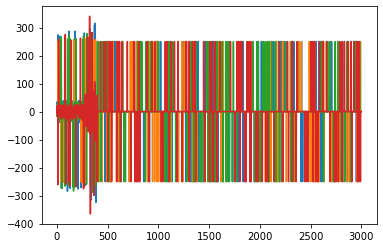

In [341]:
# To help you get started...
from IPython.display import display
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import os
os.chdir("C:/Users/Sohil/Documents/Tagup/exampleco_data")
data = pd.read_csv('machine_0.csv',index_col=0)

plt.plot(range(len(data)), data)
plt.show()

In [342]:
### Import Libraries
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import plotly as px
import pandas as pd
import plotly.graph_objects as go
import plotly.express as pl
from plotly.subplots import make_subplots
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.svm import OneClassSVM
from sklearn.decomposition import PCA 
from scipy import ndimage
from scipy import stats
from sklearn.metrics import mean_squared_error

import seaborn as sns
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from math import sqrt



import keras
import keras.utils
from pyod.models.auto_encoder import AutoEncoder
from keras.models import Model
from keras.layers import Dense, Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler 

## 1. Data Exploration 

First I see the raw data from any of the machine

In [343]:
data.head()

,0,1,2,3
2019-01-01 00:00:00.000000000,12.626096,8.803120,-11.809200,10.083961
2019-01-01 08:00:09.603201067,10.831994,2.816327,11.554778,21.892853
2019-01-01 16:00:19.206402134,21.083510,-0.672645,-17.839178,-1.349024
2019-01-02 00:00:28.809603201,32.294495,6.525132,-13.498586,-4.250752
2019-01-02 08:00:38.412804268,28.057100,3.691359,21.984744,13.670561


In [344]:
data.reset_index(inplace=True)
data['dt'] = pd.to_datetime(data['dt'])

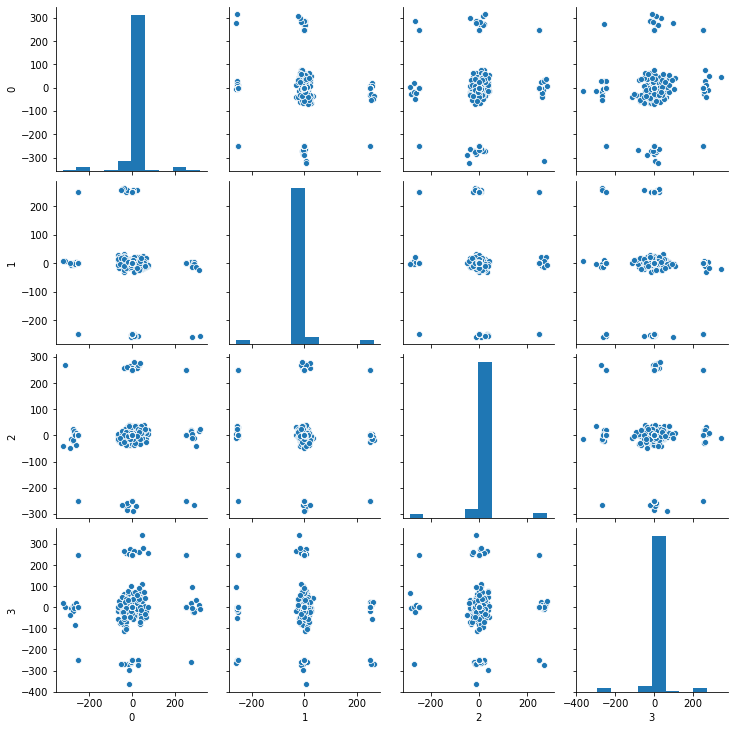

In [354]:
## feature plotted pairwise 
sns.pairplot(data)

In [358]:
# plot the training data with 4 signals
from plotly.subplots import make_subplots
import plotly.offline as pyo

pyo.init_notebook_mode()
fig = make_subplots(rows=2, cols=2)
fig.add_trace(go.Scatter(x=data['dt'], y=data[0], name="Feature 1"),row=1,col=1)
fig.add_trace(go.Scatter(x=data['dt'], y=data[1], name="Feature 2"),row=1,col=2)
fig.add_trace(go.Scatter(x=data['dt'], y=data[2], name="Feature 3"),row=2,col=1)
fig.add_trace(go.Scatter(x=data['dt'], y=data[3], name="Feature 4"),row=2,col=2)
fig.update_layout(title_text='Sensor Data',xaxis_rangeslider_visible=True)
# fig.tight_layout()
fig.show()

#### Clearly, there are outliers in the data and the noise has shown to be present as evident from the question description. The sensor data seems to follow a normal distribution but because of the noise and outliers, the graphs aren't shaped.

#### Hence, I am employing a Median filter to remove the noise and normalize using the z-score.

In [359]:
## Perform Median image filtering
col = ['dt',0,1,2,3]
data.columns = col
cdata =  pd.DataFrame(ndimage.median_filter(np.array(data.drop(columns=['dt'])),5))
cdata=pd.DataFrame(stats.zscore(cdata))
cdata.index=data['dt']
cdata.head()

,0,1,2,3
dt,,,,
2019-01-01 00:00:00.000000000,2.856515,2.306481,2.802393,3.271354
2019-01-01 08:00:09.603201067,2.856515,2.147624,2.448134,-0.227575
2019-01-01 16:00:19.206402134,2.856515,2.306481,2.802393,1.383834
2019-01-02 00:00:28.809603201,2.121737,2.306481,1.034306,1.060729
2019-01-02 08:00:38.412804268,2.121737,1.391847,-0.172704,-1.092798


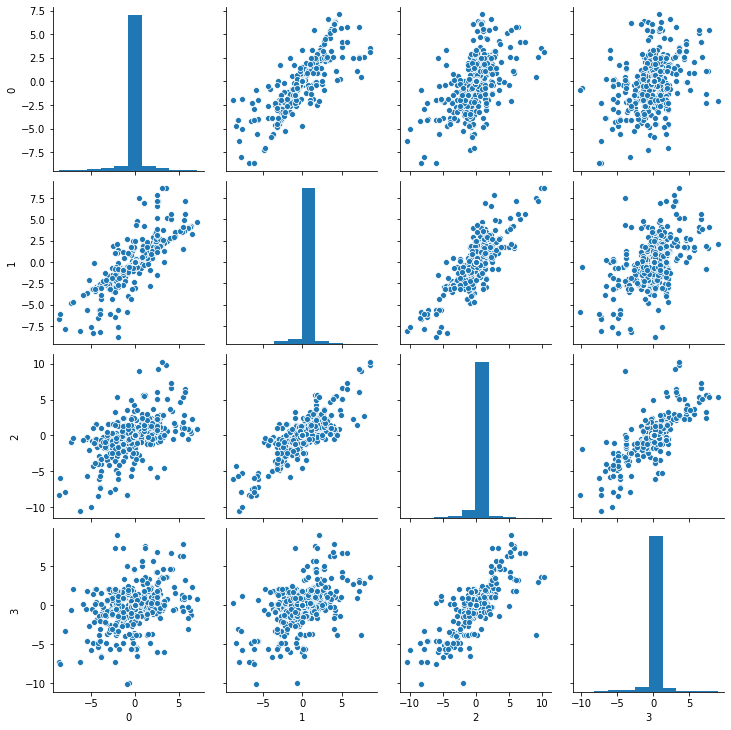

In [349]:
sns.pairplot(cdata)

#### It is seen the data is more evenly distributed that would help making algorithmic analysis. It is also seen that sensor data correlate with each other which hints at using Principal Component Analysis which finds the vectors of maximum variance.

In [360]:
cdata=clean(0)
fig = make_subplots(rows=2, cols=2)
fig.add_trace(go.Scatter(x=cdata.index, y=cdata[0], name="Feature 1"),row=1,col=1)
fig.add_trace(go.Scatter(x=cdata.index, y=cdata[1], name="Feature 2"),row=1,col=2)
fig.add_trace(go.Scatter(x=cdata.index, y=cdata[2], name="Feature 3"),row=2,col=1)
fig.add_trace(go.Scatter(x=cdata.index, y=cdata[3], name="Feature 4"),row=2,col=2)
fig.update_layout(title_text='Sensor Data',xaxis_rangeslider_visible=True)
fig.show()

#### The clean data is visualized above sensor-wise and it can be used to extract the underlying time series trends. PCA is hsown below where it is seen that 2 principal components would be sufficient to represent the data from four sensors.

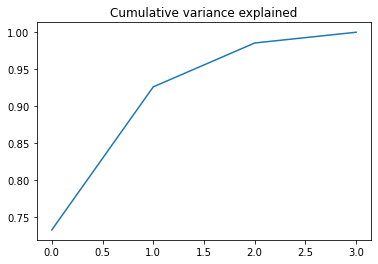

In [331]:
## Using PCA
pca = PCA(n_components=4).fit(cdata)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title("Cumulative variance explained")

pca1 = PCA(n_components=2)
pc = pca1.fit_transform(cdata)
pc_df = pd.DataFrame(data = pc , columns = ['PC1', 'PC2'])
pc_df.index = cdata.index

fig2 = go.Figure()

fig2.add_trace(go.Scatter(x=pc_df.index, y=pc_df['PC1'], name="M 1"))

fig2.add_trace(go.Scatter(x=pc_df.index, y=pc_df['PC2'], name="M 2"))

#### It is also seen that these two PC are independent from one another as shown in the grpah below.

In [370]:
import plotly.express as px

total_var = pca1.explained_variance_ratio_.sum() * 100

labels = {str(i): f"PC {i+1}" for i in range(2)}
labels['color'] = 'Median Price'

fig = px.scatter_matrix(
    pc_df.rename(columns={'PC1':0,'PC2':1}),
    dimensions=range(2),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

# 2. Modelling

The goal for modelling is to characterize the anomalies and separate the points as by their behavior as defined by the PCA results.

## LocalOutlierFactor

Local Outlier Factor (LOF) algorithm is an unsupervised anomaly detection method which computes the local density deviation of a given data point with respect to its neighbors. It considers as outliers the samples that have a substantially lower density than their neighbors.

In [51]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
IF=pc_df
model = LocalOutlierFactor(novelty=True)
model.fit(IF)
IF['lof'] = np.array(model.predict(IF))
a = IF.loc[IF['lof'] == -1, [0,1]] #anomaly

fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=IF.index, y=IF[0], name="PCA 1",line_color='gray'))
fig2.add_trace(go.Scatter(x=IF.index, y=IF[1], name="PCA 2",line_color='red'))
fig2.add_trace(go.Scatter(x=a.index, y=a[0], mode='markers'))
fig2.add_trace(go.Scatter(x=a.index, y=a[1], mode='markers'))
fig2.show()

## Isolation Forest

IsolationForest ‘isolates’ observations by randomly selecting a feature and then randomly selecting a split value between the maximum and minimum values of the selected feature.

In [312]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
model = IsolationForest(n_estimators=10)
model.fit(IF[[0,1]].values)
IF['isf'] = np.array(model.predict(IF[[0,1]]))
a = IF.loc[IF['isf'] == -1, [0,1]] #anomaly

fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=IF.index, y=IF[0], name="PCA 1",line_color='gray'))
fig2.add_trace(go.Scatter(x=IF.index, y=IF[1], name="PCA 2",line_color='red'))
fig2.add_trace(go.Scatter(x=a.index, y=a[0], mode='markers'))
fig2.add_trace(go.Scatter(x=a.index, y=a[1], mode='markers'))
fig2.show()

## DBSCAN

DBSCAN - Density-Based Spatial Clustering of Applications with Noise. Finds core samples of high density and expands clusters from them.

In [275]:
from sklearn.cluster import DBSCAN
outlier_detection = DBSCAN(eps = 1.5,metric="euclidean",min_samples = 5,n_jobs = -1)
clusters = outlier_detection.fit_predict(IF[[0,1]])
IF['dbscan'] = np.array(clusters)
a = IF.loc[IF['dbscan'] == -1, [0,1]] #anomaly

fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=IF.index, y=IF[0], name="PCA 1",line_color='gray'))
fig2.add_trace(go.Scatter(x=IF.index, y=IF[1], name="PCA 2",line_color='red'))
fig2.add_trace(go.Scatter(x=a.index, y=a[0], mode='markers'))
fig2.add_trace(go.Scatter(x=a.index, y=a[1], mode='markers'))
fig2.show()

## Mahalonobis Distance

Mahalonobis distance is the distance between a point and a distribution. And not between two distinct points. It is effectively a multivariate equivalent of the Euclidean distance.

In [362]:
from scipy.stats import chi2
chi2.ppf((1-0.05),df=2998)

3126.49418958802

In [363]:
from sklearn.covariance import EmpiricalCovariance, MinCovDet
# fit a Minimum Covariance Determinant (MCD) robust estimator to data 
robust_cov = MinCovDet().fit(IF[[0,1]])
# Get the Mahalanobis distance
m = robust_cov.mahalanobis(IF[[0,1]])
IF['mhd'] = np.array(m)
a = IF.loc[IF['mhd'] > 3127] #anomaly

fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=IF.index, y=IF[0], name="PCA 1",line_color='gray'))
fig2.add_trace(go.Scatter(x=IF.index, y=IF[1], name="PCA 2",line_color='red'))
fig2.add_trace(go.Scatter(x=a.index, y=a[0], mode='markers'))
fig2.add_trace(go.Scatter(x=a.index, y=a[1], mode='markers'))
fig2.show()

In [242]:
class preprocess(object):
    def __init__(self,n):
        self.data=pd.read_csv("machine_%s.csv"%n,index_col=0)
        self.data.reset_index(inplace=True)
        col = ['dt',0,1,2,3]
        self.data.columns = col
        self.data['dt'] = pd.to_datetime(self.data['dt'])
    def get_index(self):
        return self.data['dt']
    def _clean(self):
        self.data =  pd.DataFrame(ndimage.median_filter(np.array(self.data.drop(columns=['dt'])),5))
        self.data=pd.DataFrame(stats.zscore(self.data))
    def _make_pca(self):
        pca1 = PCA(n_components=2)
        self.pc = pd.DataFrame(pca1.fit_transform(self.data[[0,1]]))
        self.pc.index=self.data.index
    def output(self):
        preprocess._clean(self)
        preprocess._make_pca(self)
        ret=self.pc
        model = LocalOutlierFactor(novelty=True)
        model.fit(self.pc)
        ret['lof'] = np.array(model.predict(self.pc))
        model = IsolationForest(n_estimators=1000,max_features=1)
        model.fit(self.pc)
        ret['isf'] = np.array(model.predict(self.pc))
        outlier_detection = DBSCAN(eps = 1.5,metric="euclidean",min_samples = 5,n_jobs = -1)
        clusters = outlier_detection.fit_predict(self.pc)
        ret['dbscan'] = np.array(clusters)
        robust_cov = MinCovDet().fit(self.pc)
        m = robust_cov.mahalanobis(self.pc)
        ret['mhd'] = np.array(m)
        return ret
        

## 3. Series Forecasting with Deep Learning

With all the anomaly detection algorithm results, we can formulate a deep learning LSTM encoder that takes in the above results and utilize the timeseries property of the data.The problem is converted to supervised learning with past two lagged information (var(t-1) and var(t-2)). 

In [161]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [159]:
s=[]
for i in range(15):
    s.append(preprocess(i).output())

values=pd.concat(s) ### Training
s=[]
for i in range(15,20):
    s.append(preprocess(i).output())

values2=pd.concat(s) ### Testing

In [167]:
def nn_input(values):
    # ensure all data is float
    values = values.astype('float64')

    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)

    # frame as supervised learning
    reframed = series_to_supervised(scaled, 2, 1)
    return reframed
reframed.head(5)

,var1(t-2),var2(t-2),var3(t-2),var4(t-2),var5(t-2),var6(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t)
2,0.362276,0.417935,1.0,0.0,0.1,0.012821,0.402384,0.341964,1.0,0.0,0.1,0.012869,0.380625,0.377761,1.0,0.0,0.1,0.011205
3,0.402384,0.341964,1.0,0.0,0.1,0.012869,0.380625,0.377761,1.0,0.0,0.1,0.011205,0.412315,0.369235,1.0,0.0,0.1,0.006882
4,0.380625,0.377761,1.0,0.0,0.1,0.011205,0.412315,0.369235,1.0,0.0,0.1,0.006882,0.458444,0.322009,1.0,0.0,0.1,0.010460
5,0.412315,0.369235,1.0,0.0,0.1,0.006882,0.458444,0.322009,1.0,0.0,0.1,0.010460,0.412852,0.348720,1.0,0.0,0.1,0.009904
6,0.458444,0.322009,1.0,0.0,0.1,0.010460,0.412852,0.348720,1.0,0.0,0.1,0.009904,0.337780,0.244253,1.0,0.0,0.1,0.064286


In [168]:
# ensure all data is float
values2 = values2.astype('float64')

# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values2)

# frame as supervised learning
reframed2 = series_to_supervised(scaled, 2, 1)
reframed2.head(5)


,var1(t-2),var2(t-2),var3(t-2),var4(t-2),var5(t-2),var6(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t)
2,0.514712,0.482850,1.0,0.0,0.111111,4.432343e-07,0.486881,0.438117,1.0,1.0,0.222222,1.546122e-08,0.501836,0.459363,1.0,1.0,0.222222,3.530935e-08
3,0.486881,0.438117,1.0,1.0,0.222222,1.546122e-08,0.501836,0.459363,1.0,1.0,0.222222,3.530935e-08,0.480501,0.447282,1.0,1.0,0.222222,1.195627e-08
4,0.501836,0.459363,1.0,1.0,0.222222,3.530935e-08,0.480501,0.447282,1.0,1.0,0.222222,1.195627e-08,0.448177,0.415036,1.0,1.0,0.222222,1.970991e-08
5,0.480501,0.447282,1.0,1.0,0.222222,1.195627e-08,0.448177,0.415036,1.0,1.0,0.222222,1.970991e-08,0.478898,0.435800,1.0,1.0,0.222222,1.120477e-08
6,0.448177,0.415036,1.0,1.0,0.222222,1.970991e-08,0.478898,0.435800,1.0,1.0,0.222222,1.120477e-08,0.513728,0.405428,1.0,0.0,0.111111,4.170229e-07


In [206]:
def nn_input(n):
    values=preprocess(n).output()
    # ensure all data is float
    values = values.astype('float64')

    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)

    # frame as supervised learning
    reframed = series_to_supervised(scaled, 2, 1)
    return reframed

Since this is a supervised learning problem, I have divided using the reconstruction losses for determining anomalies in the data. LSTM is a very important component in the reconstruction of the original dataset capable of learning order dependence in sequence prediction problems. LSTM makes decision by considering the current input, previous output and previous memory. If a data point suffers low loss in the reconstruction, it could be a normal data point. We can set a boundary of the loss above which the points will be filtered out as an anomaly.

In [193]:
from tensorflow import keras
from keras.layers import LSTM, Dense, TimeDistributed, Lambda, Input
from keras.models import Sequential, Model
from keras import backend as K
from keras import optimizers
from keras.callbacks import History 
class LSTMAE(object):
    def __init__(self):
        self.model = None

    def create(self, size):
        model = Sequential()
        model.add(LSTM(units=64, input_shape=(size, 1), return_sequences=False))
        model.add(Dense(units=size, activation='relu'))
        optimizer=optimizers.Adam(learning_rate=0.0005)
        model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mean_absolute_error'])
        print(model.summary())
        return model

    def fit(self, ts, batch_size=32, epochs=40, validation_data=(np.expand_dims(reframed,axis=2),reframed2.values), verbose=1):
        self.size = ts.shape[1]
        its = np.expand_dims(ts, axis=2)
        self.model = self.create(self.size)
        history = self.model.fit(x=its, y=ts,batch_size=batch_size,epochs=epochs,verbose=verbose,
                       validation_data=(np.expand_dims(reframed2,axis=2),reframed2.values))
        return history

    def predict(self, ts):
        its = np.expand_dims(ts, axis=2)
        ots = self.model.predict(x=its)
        dist = np.linalg.norm(ts - ots, axis=-1)
        return dist

In [194]:
lae = LSTMAE()
history=lae.fit(reframed.values)

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_16 (LSTM)               (None, 64)                16896     
_________________________________________________________________
dense_13 (Dense)             (None, 18)                1170      
Total params: 18,066
Trainable params: 18,066
Non-trainable params: 0
_________________________________________________________________
None
Train on 44998 samples, validate on 14998 samples
Epoch 1/40
44998/44998 [==============================] - 25s 545us/step - loss: 0.0786 - mean_absolute_error: 0.1105 - val_loss: 0.0547 - val_mean_absolute_error: 0.0883
Epoch 2/40
44998/44998 [==============================] - 23s 522us/step - loss: 0.0525 - mean_absolute_error: 0.0748 - val_loss: 0.0517 - val_mean_absolute_error: 0.0789
Epoch 3/40
44998/44998 [==============================] - 24s 544us/step - loss: 0.0507 - mean_absolute_error: 0.0

dict_keys(['val_loss', 'val_mean_absolute_error', 'loss', 'mean_absolute_error'])


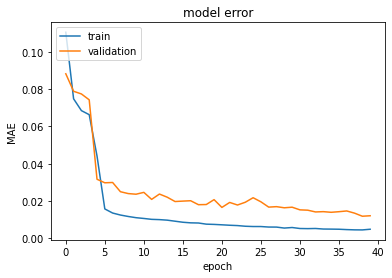

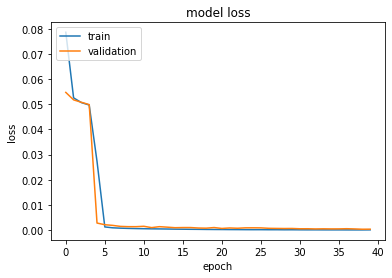

In [195]:
print(history.history.keys())
#  "Accuracy"
plt.plot(history.history['mean_absolute_error'])
plt.plot(history.history['val_mean_absolute_error'])
plt.title('model error')
plt.ylabel('MAE')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

## 4. Testing

We use the machine data from 15 to 20 to test the LSTM results. Simply change n here and run to get the results. An additional point is I set the threshold as the average number of anomalies predicted by DBSCAN and IsolationForest method. This was heuristically determined and it serves a great advantge in cases where we don't know number of anomalies in advance.

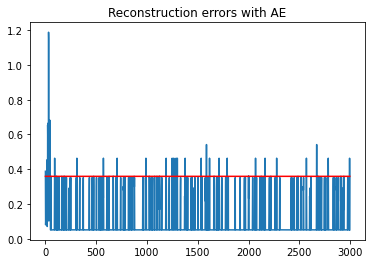

In [368]:
##Testing with machine number
n=19
raw=preprocess(n).output()
scores = lae.predict(nn_input(n))
raw['dt']=preprocess(n).get_index()
# Setting Threshold
avg=(raw[raw['dbscan']==-1].shape[0]+raw[raw['isf']==-1].shape[0])/2
rat=1-avg/raw.shape[0]
sorted_scores = sorted(scores)
threshold = sorted_scores[round(len(scores) * rat)]

# Plot Reconstruction Errors 
plt.plot(scores)
plt.plot([threshold]*len(scores), c='r')
plt.title("Reconstruction errors with AE")
plt.show() 

In [369]:
a = raw.loc[np.where(scores > threshold)] #anomaly
fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=raw['dt'], y=raw[0], name="PCA 1",line_color='gray'))
fig2.add_trace(go.Scatter(x=raw['dt'], y=raw[1], name="PCA 2",line_color='yellow'))
fig2.add_trace(go.Scatter(x=a['dt'], y=a[0], mode='markers'))
fig2.add_trace(go.Scatter(x=a['dt'], y=a[1], mode='markers'))
fig2.show()

## 5. Summary

* For the last set of graph, it could be identified what well in advance if there are signs of anomalies (faulty mode of operation).If there are more than one consecutive timestamps are reported as anomaly data, this means the machine is entering to "faulty" state and the company should do something as soon as possible to avoid it going to the "failed" state.
* The analysis uses all dataset provided.
* The advantage here is the process is fully automated. No matter what machine there is, it determines the threshold on it own and thus ensures smoother yet robust deployment.
* Further, I think using time-series models like auto-arima, sarima, etc. could be added in the ensemble and more trial and error could be done to ensure the LSTM prediction work great.
* I have tried to make object-oriented functions which is a healthy practice once deployment is being considered.
* I haven't done exhaustive tuning of neural network parameters but there are well known packages like talos, gridsearchcv, etc. that could work well.
* The graphs help figure out the exact time and date of the anomaly "alarms" and could be used in presentation pitches for getting immediate reference.